# Problem 1

In [ ]:
%pip install dtaidistance

In [2]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from dtaidistance import dtw, dtw_visualisation
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.linalg import eigsh
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import adjusted_rand_score, silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

In [3]:
import warnings
warnings.simplefilter(action='ignore')

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

**Note:** For all experiments and analysis in this assignment, we restrict our focus to a **single-dimensional time series** — specifically, the **body acceleration along the x-axis** (`body_acc_x`). This simplifies the problem setting while still retaining meaningful temporal dynamics for tasks like embedding, clustering, and visualization.


## Task 1: Preprocessing the Time-Series Data

In [ ]:
# Calculate exhaustive DTW distance between all possible pairs of subjects, activities and windows
# --- Utility functions ---

def load_data(file_path):
    """Load a text file with np.loadtxt."""
    return np.loadtxt(file_path)

def load_inertial_data(base_folder):
    """
    Load raw inertial signal data (for one sensor axis, e.g., body_acc_x)
    along with subject and activity info.
    """
    data = load_data(os.path.join(base_folder, "body_acc_x_train.txt"))
    subject = load_data(os.path.join(base_folder, "../subject_train.txt"))
    activity = load_data(os.path.join(base_folder, "../y_train.txt"))
    # Stack subject as first column and activity as last column.
    # Final shape: (n_windows, 1 + 128 + 1) = (n_windows, 130)
    data = np.column_stack((subject, data, activity))
    return data

def extract_all_windows(data, sample_rate=1):
    """
    Extract all windows (or sample every nth window) for each subject-activity pair.
    
    Parameters:
    - data: The loaded data with shape (n_windows, 130)
    - sample_rate: Sample every nth window (default=1 means take all windows)
    
    Returns a dictionary mapping (subject, activity, window_idx) -> time series (length 128).
    """
    windows = {}
    window_idx = 0
    
    # Group by subject and activity
    unique_pairs = np.unique(data[:, [0, -1]], axis=0)
    
    for subj, act in unique_pairs:
        # Get all windows for this subject-activity pair
        mask = (data[:, 0] == subj) & (data[:, -1] == act)
        subset = data[mask]
        
        # Sample every nth window
        for i in range(0, len(subset), sample_rate):
            windows[(int(subj), int(act), window_idx)] = subset[i, 1:-1]
            window_idx += 1
    
    return windows

In [6]:
def compute_pairwise_dtw(windows):
    """
    Compute pairwise DTW distances between all windows.
    Returns a list of keys (subject, activity, window_idx) and a distance matrix.
    """
    keys = list(windows.keys())
    n = len(keys)
    dist_mat = np.zeros((n, n))
    
    print(f"\nComputing pairwise DTW distances for {n} windows...")
    
    for i in range(n):
        if i % 100 == 0:
            print(f"Processing window {i}/{n}...")
        for j in range(i, n):
            d = dtw.distance_fast(windows[keys[i]], windows[keys[j]])
            dist_mat[i, j] = d
            dist_mat[j, i] = d
    
    return keys, dist_mat

In [7]:
def compute_pairwise_euclidean(windows):
    """
    Compute pairwise Euclidean distances between all windows.
    Returns a list of keys (subject, activity, window_idx) and a distance matrix.
    """
    keys = list(windows.keys())
    n = len(keys)
    data_matrix = np.array([windows[key] for key in keys])
    
    print(f"\nComputing pairwise Euclidean distances for {n} windows...")
    
    dist_mat = squareform(pdist(data_matrix, metric='euclidean'))
    
    return keys, dist_mat

In [8]:
def exhaustive_dtw_analysis(base_folder, sample_rate=1):
    """
    Perform an exhaustive analysis on all windows or sampled windows:
      1. Load data from the Inertial Signals folder for one sensor axis.
      2. Extract subject and activity labels.
      3. Extract all windows (or sample every nth window).
      4. Compute the pairwise DTW distance matrix.
    
    Parameters:
    - base_folder: Path to the Inertial Signals folder
    - sample_rate: Sample every nth window (default=1 means take all windows)
    """
    data = load_inertial_data(base_folder)
    print("Data shape (with subject and activity):", data.shape)
    
    unique_subjects = np.unique(data[:, 0])
    unique_activities = np.unique(data[:, -1])
    print("Unique subjects:", unique_subjects)
    print("Unique activities:", unique_activities)
    
    windows = extract_all_windows(data, sample_rate)
    print(f"Number of windows (with sample_rate={sample_rate}):", len(windows))
    
    keys, dtw_distances = compute_pairwise_dtw(windows)
    print("Pairwise DTW distance matrix shape:", dtw_distances.shape)
    
    # Create DataFrame for easier inspection
    df = pd.DataFrame(dtw_distances, 
                     index=[f"S{s}-A{a}-W{w}" for s, a, w in keys],
                     columns=[f"S{s}-A{a}-W{w}" for s, a, w in keys])
    
    # Display a sample of the distance matrix (first 10x10)
    print("\nSample of pairwise DTW distance matrix (10x10):")
    display(df.iloc[:10, :10])
    
    # Visualize warping for a sample pair
    if len(keys) >= 2:
        ts1 = windows[keys[0]]
        ts2 = windows[keys[1]]
        path = dtw.warping_path(ts1, ts2)
        print(f"\nVisualizing warping path between {keys[0]} and {keys[1]} (DTW distance = {dtw.distance_fast(ts1, ts2):.4f})")
        dtw_visualisation.plot_warping(ts1, ts2, path, filename="warp_sample.png")
        plt.imshow(plt.imread("warp_sample.png"))
        plt.axis("off")
        plt.show()

    
    return windows, keys, dtw_distances

In [9]:
def exhaustive_euclidean_analysis(base_folder, sample_rate=1):
    """
    Perform an exhaustive analysis on all windows or sampled windows:
      1. Load data from the Inertial Signals folder for one sensor axis.
      2. Extract subject and activity labels.
      3. Extract all windows (or sample every nth window).
      4. Compute the pairwise Euclidean distance matrix.
    
    Parameters:
    - base_folder: Path to the Inertial Signals folder
    - sample_rate: Sample every nth window (default=1 means take all windows)
    """
    data = load_inertial_data(base_folder)
    print("Data shape (with subject and activity):", data.shape)
    
    unique_subjects = np.unique(data[:, 0])
    unique_activities = np.unique(data[:, -1])
    print("Unique subjects:", unique_subjects)
    print("Unique activities:", unique_activities)
    
    windows = extract_all_windows(data, sample_rate)
    print(f"Number of windows (with sample_rate={sample_rate}):", len(windows))
    
    keys, euclidean_distances = compute_pairwise_euclidean(windows)
    print("Pairwise Euclidean distance matrix shape:", euclidean_distances.shape)
    
    # Create DataFrame for easier inspection
    df = pd.DataFrame(euclidean_distances, 
                     index=[f"S{s}-A{a}-W{w}" for s, a, w in keys],
                     columns=[f"S{s}-A{a}-W{w}" for s, a, w in keys])
    
    # Display a sample of the distance matrix (first 10x10)
    print("\nSample of pairwise Euclidean distance matrix (10x10):")
    display(df.iloc[:10, :10])
    
    return windows, keys, euclidean_distances

In [10]:
# --- Running the Analysis ---

# Set the base folder path to the "Inertial Signals" folder for training.
base_folder = r"human+activity+recognition+using+smartphones\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals"

Data shape (with subject and activity): (7352, 130)
Unique subjects: [ 1.  3.  5.  6.  7.  8. 11. 14. 15. 16. 17. 19. 21. 22. 23. 25. 26. 27.
 28. 29. 30.]
Unique activities: [1. 2. 3. 4. 5. 6.]
Number of windows (with sample_rate=1): 7352

Computing pairwise DTW distances for 7352 windows...
Processing window 0/7352...
Processing window 100/7352...
Processing window 200/7352...
Processing window 300/7352...
Processing window 400/7352...
Processing window 500/7352...
Processing window 600/7352...
Processing window 700/7352...
Processing window 800/7352...
Processing window 900/7352...
Processing window 1000/7352...
Processing window 1100/7352...
Processing window 1200/7352...
Processing window 1300/7352...
Processing window 1400/7352...
Processing window 1500/7352...
Processing window 1600/7352...
Processing window 1700/7352...
Processing window 1800/7352...
Processing window 1900/7352...
Processing window 2000/7352...
Processing window 2100/7352...
Processing window 2200/7352...
Proce

,S1-A1-W0,S1-A1-W1,S1-A1-W2,S1-A1-W3,S1-A1-W4,S1-A1-W5,S1-A1-W6,S1-A1-W7,S1-A1-W8,S1-A1-W9
S1-A1-W0,0.000000,1.101397,1.097636,1.427970,1.347415,1.462644,1.521418,1.053972,1.055930,1.026389
S1-A1-W1,1.101397,0.000000,1.118247,1.617908,1.486856,1.618709,1.543641,0.875743,1.209142,0.712539
S1-A1-W2,1.097636,1.118247,0.000000,1.012929,1.582128,1.416181,1.185990,1.052876,1.273373,1.250839
S1-A1-W3,1.427970,1.617908,1.012929,0.000000,1.669253,1.398661,1.219073,1.507064,1.679848,1.697334
S1-A1-W4,1.347415,1.486856,1.582128,1.669253,0.000000,1.932989,1.630149,1.259291,1.313136,1.228873
S1-A1-W5,1.462644,1.618709,1.416181,1.398661,1.932989,0.000000,1.453667,1.710992,1.474593,1.773065
S1-A1-W6,1.521418,1.543641,1.185990,1.219073,1.630149,1.453667,0.000000,1.588705,1.144716,1.309750
S1-A1-W7,1.053972,0.875743,1.052876,1.507064,1.259291,1.710992,1.588705,0.000000,1.292321,0.932293
S1-A1-W8,1.055930,1.209142,1.273373,1.679848,1.313136,1.474593,1.144716,1.292321,0.000000,0.872465
S1-A1-W9,1.026389,0.712539,1.250839,1.697334,1.228873,1.773065,1.309750,0.932293,0.872465,0.000000



Visualizing warping path between (1, 1, 0) and (1, 1, 1) (DTW distance = 1.1014)


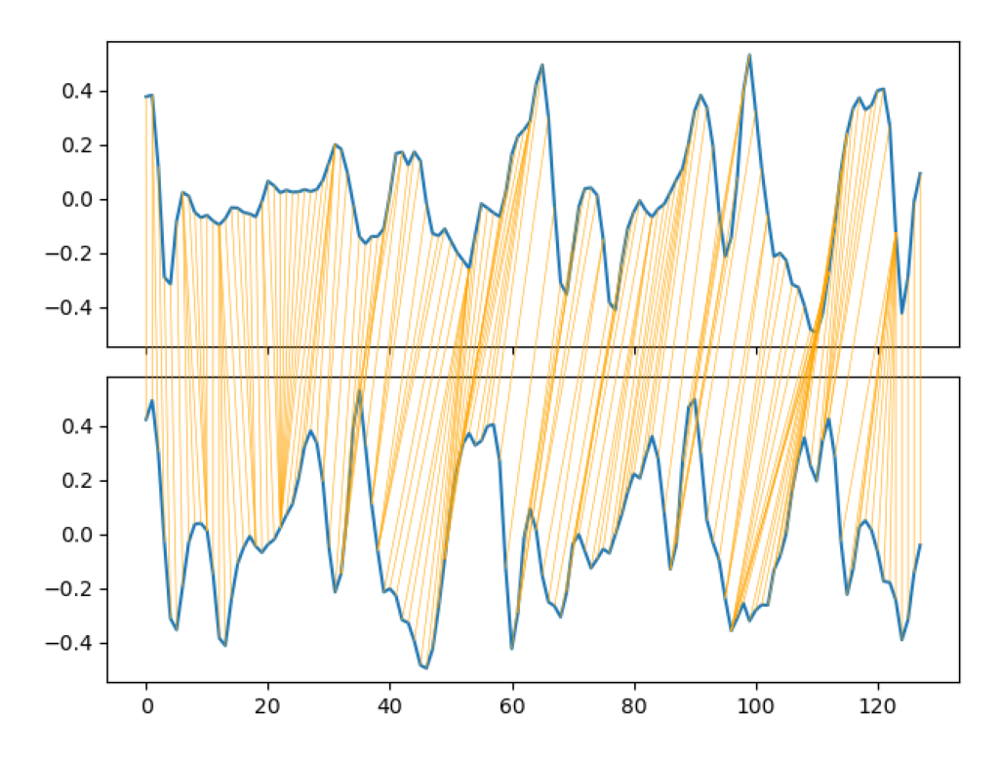

Analysis took 119.35 minutes.
Analysis completed.


In [ ]:
# For all windows (no sampling)
start = time.time()
windows, all_keys, dtw_distances = exhaustive_dtw_analysis(base_folder)
end = time.time()
print(f"Analysis took {(end - start) / 60:.2f} minutes.")

# Save the distance matrix to a file
np.save("dtw_distances.npy", dtw_distances)

print(f"Analysis completed.")

In [11]:
# For all windows (no sampling)
start = time.time()
windows, all_keys, dtw_distances = exhaustive_euclidean_analysis(base_folder)
end = time.time()
print(f"Analysis took {(end - start) / 60:.2f} minutes.")

# Save the distance matrix to a file
np.save("euclidean_distances.npy", dtw_distances)
print(f"Analysis completed.")

Data shape (with subject and activity): (7352, 130)
Unique subjects: [ 1.  3.  5.  6.  7.  8. 11. 14. 15. 16. 17. 19. 21. 22. 23. 25. 26. 27.
 28. 29. 30.]
Unique activities: [1. 2. 3. 4. 5. 6.]
Number of windows (with sample_rate=1): 7352

Computing pairwise Euclidean distances for 7352 windows...
Pairwise Euclidean distance matrix shape: (7352, 7352)

Sample of pairwise Euclidean distance matrix (10x10):


,S1-A1-W0,S1-A1-W1,S1-A1-W2,S1-A1-W3,S1-A1-W4,S1-A1-W5,S1-A1-W6,S1-A1-W7,S1-A1-W8,S1-A1-W9
S1-A1-W0,0.000000,3.956500,3.695580,3.290579,3.655445,4.194511,2.287015,3.710332,2.859719,3.598483
S1-A1-W1,3.956500,0.000000,4.310099,4.138364,2.737509,4.209154,4.464665,2.206603,4.401918,3.143406
S1-A1-W2,3.695580,4.310099,0.000000,4.459139,4.033920,2.873431,4.088426,4.456630,3.555507,4.698087
S1-A1-W3,3.290579,4.138364,4.459139,0.000000,4.705086,3.966260,3.111989,3.979102,3.357699,3.778471
S1-A1-W4,3.655445,2.737509,4.033920,4.705086,0.000000,4.901413,3.852908,3.151912,3.999311,3.380729
S1-A1-W5,4.194511,4.209154,2.873431,3.966260,4.901413,0.000000,4.745213,4.377385,3.968270,4.753132
S1-A1-W6,2.287015,4.464665,4.088426,3.111989,3.852908,4.745213,0.000000,4.235597,2.791839,4.031339
S1-A1-W7,3.710332,2.206603,4.456630,3.979102,3.151912,4.377385,4.235597,0.000000,4.129731,2.484993
S1-A1-W8,2.859719,4.401918,3.555507,3.357699,3.999311,3.968270,2.791839,4.129731,0.000000,3.947602
S1-A1-W9,3.598483,3.143406,4.698087,3.778471,3.380729,4.753132,4.031339,2.484993,3.947602,0.000000


Analysis took 0.10 minutes.
Analysis completed.


Loading distance matrix from dtw_distances.npy...
Original matrix shape: (7352, 7352)
Generating heatmap...
Heatmap saved to dtw_heatmap.png


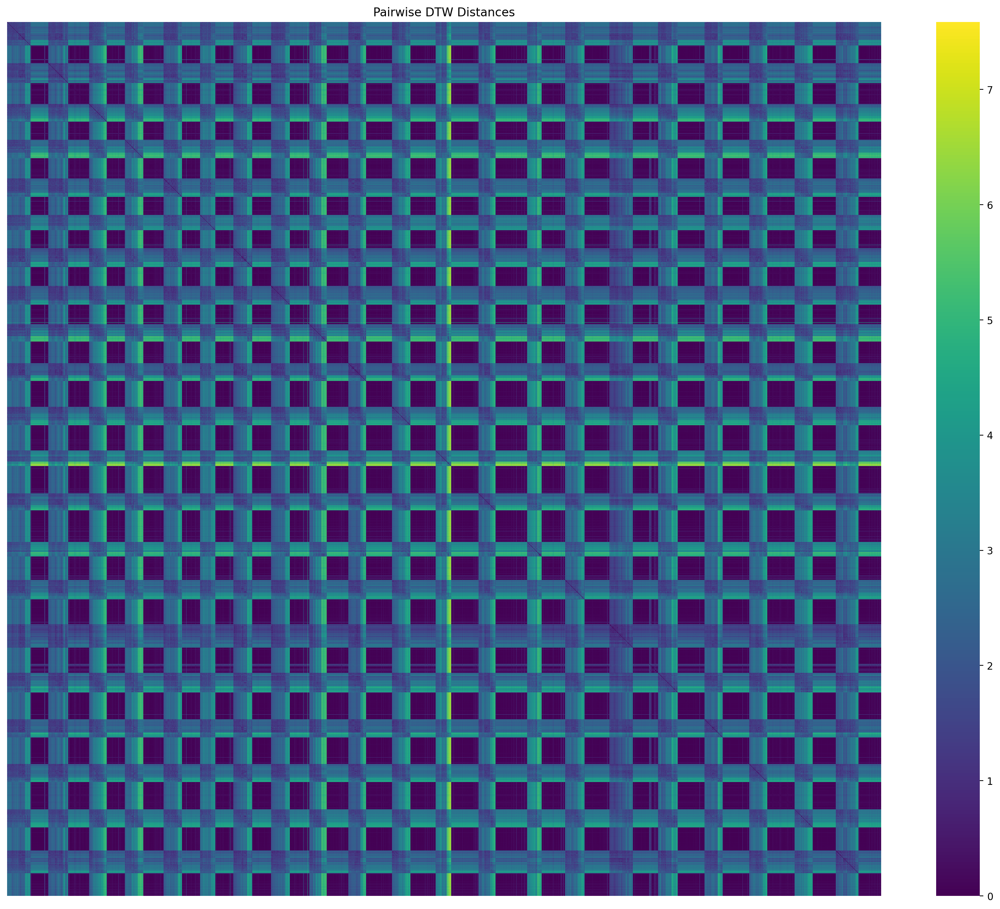

Loading distance matrix from euclidean_distances.npy...
Original matrix shape: (7352, 7352)
Generating heatmap...
Heatmap saved to euclidean_heatmap.png


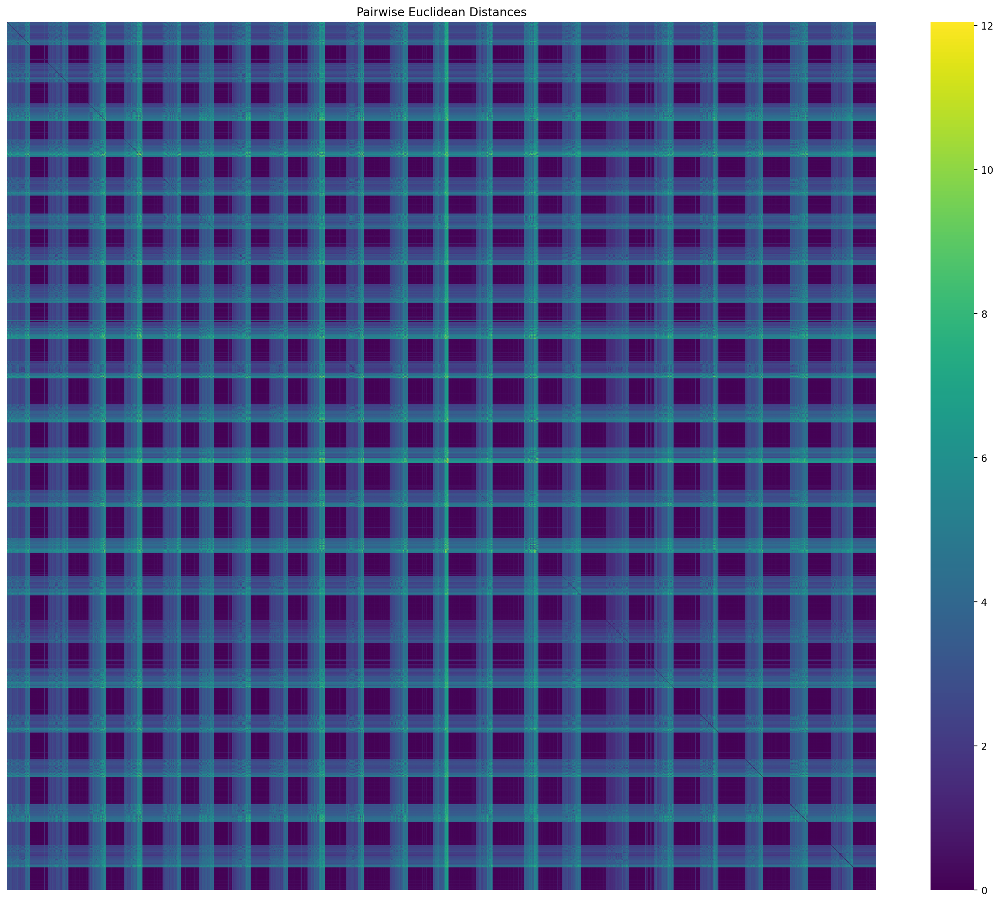

In [13]:
def visualize_distance_matrix(npy_file, sample_rate=1, save_path=None, title=None):
    """
    Visualize a pairwise distance matrix (DTW, Euclidean, etc.) from a saved .npy file.

    Parameters:
    - npy_file: Path to the .npy file containing the distance matrix.
    - sample_rate: Subsampling factor for visualization. 
    - save_path: File path to save the generated heatmap.
    - title: Title of the plot.
    """
    if not os.path.exists(npy_file):
        raise FileNotFoundError(f"{npy_file} not found")

    print(f"Loading distance matrix from {npy_file}...")
    dist_mat = np.load(npy_file)
    print(f"Original matrix shape: {dist_mat.shape}")

    if sample_rate > 1:
        dist_mat = dist_mat[::sample_rate, ::sample_rate]
        print(f"Subsampled matrix shape: {dist_mat.shape}")

    # Plotting
    print("Generating heatmap...")
    plt.figure(figsize=(20, 16))
    sns.heatmap(dist_mat, xticklabels=False, yticklabels=False, cmap='viridis')
    plt.title(title)
    plt.savefig(save_path, dpi=500, bbox_inches="tight")
    print(f"Heatmap saved to {save_path}")

    plt.imshow(plt.imread(save_path))
    plt.axis("off")
    plt.show()

    plt.close()


visualize_distance_matrix("dtw_distances.npy", save_path = "dtw_heatmap.png", title = "Pairwise DTW Distances")
visualize_distance_matrix("euclidean_distances.npy", save_path = "euclidean_heatmap.png", title = "Pairwise Euclidean Distances")


Both heatmaps show a noticeable block-like diagonal structure, indicating that data samples grouped close together (in window index) are more similar to each other than to those far apart. These blocks may represent clusters of similar activities or windows from the same subject performing the same activity. The clear criss-cross grid pattern seen in both distance matrices suggests strong intra-group similarity and weaker inter-group similarity.


## Task 2: Apply Diffusion Maps for Dimensionality Reduction

In [12]:
def diffusion_maps_symmetric_laplacian(distance_matrix, epsilon=5.0, n_components=3):
    """
    Compute diffusion map embedding using symmetric normalized graph Laplacian.
    
    Parameters:
    - distance_matrix: 2D array of shape (n_samples, n_samples), e.g. DTW distances.
    - epsilon: kernel scale parameter.
    - n_components: number of embedding dimensions to return (excluding trivial).
    
    Returns:
    - embedding: ndarray of shape (n_samples, n_components)
    - eigenvalues: array of selected eigenvalues
    """
    print("Constructing diffusion kernel...")
    K = np.exp(-distance_matrix ** 2 / epsilon)
    
    print("Computing degree matrix...")
    d = np.sum(K, axis=1)
    D_inv_sqrt = np.diag(1.0 / np.sqrt(d + 1e-10))  # avoid division by 0

    print("Computing symmetric normalized Laplacian...")
    K_sym = D_inv_sqrt @ K @ D_inv_sqrt
    L = np.eye(K.shape[0]) - K_sym

    print("Eigen-decomposing the Laplacian...")
    eigvals, eigvecs = eigsh(L, k=n_components + 1, which='SM')  # Smallest magnitude (bottom eigenvectors)
    
    # Skip the trivial first eigenvector (associated with eigenvalue 0)
    embedding = eigvecs[:, 1:n_components + 1]
    selected_eigvals = eigvals[1:n_components + 1]
    
    return embedding, selected_eigvals


In [13]:
dist_mat = np.load("dtw_distances.npy")
# I am choosing n_components=3 to get a 3D embedding
embedding_dm, eigvals = diffusion_maps_symmetric_laplacian(dist_mat, n_components=3)
print("Embedding shape:", embedding_dm.shape) 

Constructing diffusion kernel...
Computing degree matrix...
Computing symmetric normalized Laplacian...
Eigen-decomposing the Laplacian...
Embedding shape: (7352, 3)


In [14]:
labels_activity = load_data(os.path.join(base_folder, "../y_train.txt"))

## Task 3: Clustering in the Diffusion Space

In [15]:
X = embedding_dm

# Normalize features (helps for DBSCAN)
from sklearn.preprocessing import StandardScaler
X_scaled = StandardScaler().fit_transform(X)

# Method 1: KMeans Clustering
kmeans = KMeans(n_clusters=6, random_state=24)
kmeans_labels = kmeans.fit_predict(X_scaled)

# Method 2: DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=10)
dbscan_labels = dbscan.fit_predict(X_scaled)

In [16]:
# Evaluation
def evaluate_clustering(labels, method_name):
    print(f"\n--- {method_name} ---")
    ari = adjusted_rand_score(labels_activity, labels)
    sil = silhouette_score(X_scaled, labels)
    print(f"Adjusted Rand Index: {ari:.4f}")
    print(f"Silhouette Score:    {sil:.4f}")

evaluate_clustering(kmeans_labels, "KMeans")
evaluate_clustering(dbscan_labels, "DBSCAN")


--- KMeans ---
Adjusted Rand Index: 0.0131
Silhouette Score:    0.6947

--- DBSCAN ---
Adjusted Rand Index: 0.0013
Silhouette Score:    0.5796


## Task 4: Visualization and Interpretation

In [17]:
# Load the Raw data
raw_data = load_data(os.path.join(base_folder, "body_acc_x_train.txt"))

In [18]:
# Dimensionality Reduction Techniques
# 1. Raw Feature Space (first three features)
raw_features = raw_data[:, :3]

# 2. PCA
pca = PCA(n_components=3)
pca_features = pca.fit_transform(raw_data)

# 3. t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_features = tsne.fit_transform(raw_data)

# 4. Diffusion Maps (already computed)
diffusion_features = embedding_dm

In [50]:
import plotly.graph_objs as go

def plot_embedding(embedding_3d, labels, title, filename_prefix=None, save_dir="plots"):
    """
    Plots a 3D diffusion embedding using Plotly and optionally saves as HTML.

    Parameters:
    - embedding_3d: (n_samples, 3) numpy array of 3D diffusion coordinates
    - labels: (n_samples,) array of activity or subject labels
    - title: Title of the plot
    - filename_prefix: base name for saved .html file
    - save_dir: directory to save HTML plot
    """
    df = pd.DataFrame({
        'Dim 1': embedding_3d[:, 0],
        'Dim 2': embedding_3d[:, 1],
        'Dim 3': embedding_3d[:, 2],
        'Activity': labels
    })

    unique_labels = np.unique(labels)
    traces = []

    for label in unique_labels:
        subset = df[df['Activity'] == label]
        traces.append(go.Scatter3d(
            x=subset['Dim 1'],
            y=subset['Dim 2'],
            z=subset['Dim 3'],
            mode='markers',
            marker=dict(size=3),
            name=f"Activity {label}",
            hovertemplate=f'Activity: {label}<br>Dim 1: %{{x}}<br>Dim 2: %{{y}}<br>Dim 3: %{{z}}<extra></extra>'
        ))

    layout = go.Layout(
        title=title,
        scene=dict(
            xaxis_title='Dim 1',
            yaxis_title='Dim 2',
            zaxis_title='Dim 3'
        ),
        legend=dict(x=1.05, y=1),
        margin=dict(l=0, r=0, b=0, t=40)
    )

    fig = go.Figure(data=traces, layout=layout)

    if filename_prefix:
        os.makedirs(save_dir, exist_ok=True)
        html_path = os.path.join(save_dir, f"{filename_prefix}.html")
        fig.write_html(html_path)
        print(f"Saved interactive HTML plot to: {html_path}")

    fig.show()


plot_embedding(raw_features, labels_activity, title="Raw Feature Space", filename_prefix="raw_features")
plot_embedding(pca_features, labels_activity, title="PCA Embedding", filename_prefix="pca_embedding")
plot_embedding(tsne_features, labels_activity, title="t-SNE Embedding", filename_prefix="tsne_embedding")
plot_embedding(diffusion_features, labels_activity, title="Diffusion Maps Embedding", filename_prefix="diffusion_embedding")


Saved interactive HTML plot to: plots\raw_features.html


Saved interactive HTML plot to: plots\pca_embedding.html


Saved interactive HTML plot to: plots\tsne_embedding.html


Saved interactive HTML plot to: plots\diffusion_embedding.html


[![Raw Feature Space](plots/raw_features.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/raw_features.html)

[![PCA Embedding](plots/pca_embedding.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/pca_embedding.html)

[![t-SNE Embedding](plots/tsne_embedding.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/tsne_embedding.html)

[![Diffusion Maps Embedding](plots/diffusion_embedding.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/diffusion_embedding.html)

### Discussion - The choice of distance metric
**DTW (Dynamic Time Warping)** is preferred over Euclidean distance for time-series data because it aligns sequences that may vary in speed or length, capturing similarities even when patterns are out of phase. Unlike Euclidean distance, which compares points one-to-one, DTW handles temporal distortions, making it more robust for real-world sequential patterns such as human activity or sensor data.

### Discussion - Why Do Diffusion Maps Work Well for Time-Series Clustering?

Diffusion Maps are particularly effective for time-series clustering due to their ability to capture the intrinsic geometry of the data. Here are the key reasons:

1. **Non-Linear Relationships**: Time-series data often exhibit non-linear relationships that traditional linear methods like PCA fail to capture. Diffusion Maps use a kernel-based approach to model these non-linear structures effectively.

2. **Preservation of Local and Global Structures**: Unlike t-SNE, which focuses on preserving local neighborhoods, Diffusion Maps balance both local and global structures. This ensures that clusters are well-separated while maintaining the overall data geometry.

3. **Temporal Dynamics**: Time-series data often have temporal dependencies. Diffusion Maps can capture these dependencies by embedding the data into a space where similar temporal patterns are closer together.

## Task 5: Explorative

### Multiscale Diffusion Maps (MDM)

In [45]:
def multiscale_diffusion_maps(distance_matrix, epsilon=5.0, n_components=10, scales=[1, 4, 16]):
    print("Constructing diffusion kernel...")
    K = np.exp(-distance_matrix ** 2 / epsilon)

    print("Computing degree matrix...")
    d = np.sum(K, axis=1)
    D_inv_sqrt = np.diag(1.0 / np.sqrt(d + 1e-10))

    print("Computing symmetric normalized Laplacian...")
    K_sym = D_inv_sqrt @ K @ D_inv_sqrt
    L = np.eye(K.shape[0]) - K_sym

    print("Eigen-decomposing the Laplacian...")
    eigvals, eigvecs = eigsh(L, k=n_components + 1, which='SM')

    # Drop the trivial first eigenpair (corresponds to eigenvalue ≈ 0)
    eigvals = eigvals[1:]
    eigvecs = eigvecs[:, 1:]

    print("Generating multiscale embeddings...")
    embeddings = {}
    for t in scales:
        lambdas_t = np.power(1 - eigvals, t)  # (1 - λ)^t
        scaled = eigvecs * lambdas_t[np.newaxis, :]  # Broadcast each eigenvector by λ^t
        embeddings[t] = scaled

    return embeddings, eigvals

embeddings, diff_eigvals = multiscale_diffusion_maps(dist_mat, epsilon=5.0, n_components=3, scales=[1,4,16])


Constructing diffusion kernel...
Computing degree matrix...
Computing symmetric normalized Laplacian...
Eigen-decomposing the Laplacian...
Generating multiscale embeddings...


In [52]:
plot_embedding(embeddings[1], labels_activity, title="Multiscale Diffusion Maps Embedding for t=1",filename_prefix="mdm_embedding_t1")
plot_embedding(embeddings[4], labels_activity, title="Multiscale Diffusion Maps Embedding for t=4",filename_prefix="mdm_embedding_t4")
plot_embedding(embeddings[16], labels_activity, title="Multiscale Diffusion Maps Embedding for t=16",filename_prefix="mdm_embedding_t16")

Saved interactive HTML plot to: plots\mdm_embedding_t1.html


Saved interactive HTML plot to: plots\mdm_embedding_t4.html


Saved interactive HTML plot to: plots\mdm_embedding_t16.html


[![Multiscale Diffusion Maps t=1](plots/mdm_embedding_t1.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/mdm_embedding_t1.html)

[![Multiscale Diffusion Maps t=4](plots/mdm_embedding_t4.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/mdm_embedding_t4.html)

[![Multiscale Diffusion Maps t=16](plots/mdm_embedding_t16.png)](https://adi776borate.github.io/CS303-DiffusionMaps-Optimization-Assignment/plots/mdm_embedding_t16.html)

### Spectral Clustering Instead of K-Means

In [26]:
from sklearn.cluster import SpectralClustering

# Select the embedding at a desired scale, e.g., t = 4.
selected_t = 4
embedding_t = embeddings[selected_t]

# Standardize the embedding 
X_scaled = StandardScaler().fit_transform(embedding_t)

# Spectral Clustering
n_clusters = 6 
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
spectral_labels = spectral.fit_predict(X_scaled)

evaluate_clustering(labels_activity, spectral_labels, X_scaled)


Adjusted Rand Index: 0.0194
Silhouette Score:    0.2468
